<a href="https://colab.research.google.com/github/Sievv/Sievv/blob/main/PS_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd

# Load the data into a pandas DataFrame, specifying the encoding
df = pd.read_csv('/content/drive/MyDrive/PS/Active PS v4.csv', encoding='latin-1')
# If 'latin-1' doesn't work, try 'ISO-8859-1', 'cp1252', or others

# Display the first 5 rows of the DataFrame
df.head()

,PS ID,Sequence,Length,Charge,Hydrophobicity Percentage,Molecular Weight,MIC (µg/ml)
0,DBAASPS_1269,RRWVRRVRRWVRRVVRVVRRWVRR,24,12.7,45.0,3400.1071,1.02
1,DBAASPS_102,ALWKTLLKKVLKAAAKAALKAVLVGANA,28,5.7,67.0,2861.5565,2.50
2,DBAASPS_17810,RRWVRRVRRWVRRVVRVVRRWVRR,24,12.7,45.8,3400.1071,10.20
3,DBAASPS_1269,RRWVRRVRRWVRRVVRVVRRWVRR,24,12.7,45.8,3400.1071,1.02
4,DBAASPS_10651,KRRWPWWPWRLI,12,3.7,66.6,1780.1299,4.00


In [5]:
import pandas as pd
from Bio.SeqUtils import molecular_weight
from Bio.Seq import Seq

# Load the data (update with your actual file path)
file_path = '/content/drive/MyDrive/PS/Active PS v4.csv'  # Replace with actual path
data = pd.read_csv(file_path, encoding='ISO-8859-1')

# Function to calculate the charge based on residues (K, R, H are positively charged, D, E are negatively charged)
def calculate_charge(sequence):
    positive = sequence.count('K') + sequence.count('R') + sequence.count('H')
    negative = sequence.count('D') + sequence.count('E')
    return positive - negative

# Function to calculate the molecular weight of the peptide
def calculate_molecular_weight(sequence):
    return molecular_weight(Seq(sequence), seq_type='protein')

# Function to calculate hydrophobicity (based on Kyte-Doolittle scale or other hydrophobicity scales)
def calculate_hydrophobicity(sequence):
    hydrophobic_residues = 'AVILMFWP'
    hydrophobic_score = sum([1 for aa in sequence if aa in hydrophobic_residues])
    return hydrophobic_score

# Function to calculate the number of cysteine residues
def calculate_number_of_cysteines(sequence):
    return sequence.count('C')

# Function to calculate disulfide bridges (placeholder method, assumes one bridge per two cysteines)
def calculate_number_of_disulfide_bridges(sequence):
    cysteines = sequence.count('C')
    return cysteines // 2  # Disulfide bridges form between pairs of cysteines

# Function to calculate the isoelectric point (simplified placeholder)
def calculate_isoelectric_point(sequence):
    pKa_acidic = {'D': 3.9, 'E': 4.25}
    pKa_basic = {'K': 10.5, 'R': 12.5, 'H': 6.0}

    acidic_count = sum([sequence.count(aa) for aa in pKa_acidic])
    basic_count = sum([sequence.count(aa) for aa in pKa_basic])

    if acidic_count + basic_count > 0:
        pI = (sum([pKa_acidic[aa] * sequence.count(aa) for aa in pKa_acidic]) +
              sum([pKa_basic[aa] * sequence.count(aa) for aa in pKa_basic])) / (acidic_count + basic_count)
    else:
        pI = 7.0  # Default pI value if no acidic/basic residues

    return pI

# Amino acid composition function
def amino_acid_composition(sequence):
    amino_acids = 'ACDEFGHIKLMNPQRSTVWY'
    composition = {aa: sequence.count(aa) for aa in amino_acids}
    total_residues = len(sequence)
    composition_percent = {aa: (count / total_residues) * 100 for aa, count in composition.items()}
    return composition_percent

# Function to calculate secondary structure features (simplified)
def secondary_structure_features(sequence):
    helix_aa = 'ALIVMFYW'
    sheet_aa = 'FYW'
    turn_aa = 'GP'

    helix = sum([sequence.count(aa) for aa in helix_aa])
    sheet = sum([sequence.count(aa) for aa in sheet_aa])
    turn = sum([sequence.count(aa) for aa in turn_aa])

    flexibility = sum([sequence.count(aa) for aa in helix_aa]) / len(sequence)  # Placeholder

    return helix, turn, sheet, flexibility

# Apply all calculations to the dataset using the correct column name:
data['Length'] = data['Sequence'].apply(len)  # Use 'Sequence' without space if necessary
data['Charge'] = data['Sequence'].apply(calculate_charge)
data['Hydrophobicity'] = data['Sequence'].apply(calculate_hydrophobicity)
data['Molecular_Weight'] = data['Sequence'].apply(calculate_molecular_weight)
data['Number_of_Cysteines'] = data['Sequence'].apply(calculate_number_of_cysteines)
data['Isoelectric_Point'] = data['Sequence'].apply(calculate_isoelectric_point)
data['Amino_Acid_Composition'] = data['Sequence'].apply(amino_acid_composition)
data[['Helix', 'Turn', 'Sheet', 'Flexibility']] = data['Sequence'].apply(secondary_structure_features).apply(pd.Series)
data['Number_of_Disulfide_Bridges'] = data['Sequence'].apply(calculate_number_of_disulfide_bridges)

# Expand the Amino Acid Composition into individual columns for each amino acid
aa_columns = pd.DataFrame(data['Amino_Acid_Composition'].to_list(), columns=['A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y'])
data = pd.concat([data, aa_columns], axis=1)

# Save the updated data with all descriptors
output_file = '/content/drive/MyDrive/PS/_Active_Feature_v1.csv'  # Make sure the path is correct
data.to_csv(output_file, index=False)

# Display the updated DataFrame (optional)
print(data.head())


           PS ID                      Sequence  Length  Charge  \
0   DBAASPS_1269      RRWVRRVRRWVRRVVRVVRRWVRR      24      13   
1    DBAASPS_102  ALWKTLLKKVLKAAAKAALKAVLVGANA      28       6   
2  DBAASPS_17810      RRWVRRVRRWVRRVVRVVRRWVRR      24      13   
3   DBAASPS_1269      RRWVRRVRRWVRRVVRVVRRWVRR      24      13   
4  DBAASPS_10651                  KRRWPWWPWRLI      12       4   

   Hydrophobicity Percentage  Molecular Weight  MIC (µg/ml)  Hydrophobicity  \
0                       45.0         3400.1071         1.02              11   
1                       67.0         2861.5565         2.50              19   
2                       45.8         3400.1071        10.20              11   
3                       45.8         3400.1071         1.02              11   
4                       66.6         1780.1299         4.00               8   

   Molecular_Weight  Number_of_Cysteines  ...    M         N          P    Q  \
0         3400.1071                    0  ...  0

In [4]:
!pip install biopython

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 51.6 MB/s eta 0:00:00


In [7]:
import pandas as pd
from Bio.SeqUtils import molecular_weight
from Bio.Seq import Seq

# ... (rest of your code) ...

In [8]:
!pip install pandas

In [9]:
import pandas as pd

In [6]:
# Load the first file into a DataFrame
file_path1 = '/content/drive/MyDrive/PS/PS_Active_Feature_v1 without mic.csv'  # Replace with actual path
df1 = pd.read_csv(file_path1, encoding='latin-1')

# Load the second file into a DataFrame
file_path2 = '/content/drive/MyDrive/KP/inactive_descriptors v1.1.csv'  # Replace with actual path
df2 = pd.read_csv(file_path2, encoding='latin-1')

In [7]:
import pandas as pd

# Load the first file into a DataFrame
file_path1 = '/content/drive/MyDrive/PS/PS_Active_Feature_v1 without mic.csv'  # Replace with actual path
df1 = pd.read_csv(file_path1, encoding='latin-1')

# Load the second file into a DataFrame
file_path2 = '/content/drive/MyDrive/KP/inactive_descriptors v1.1.csv'  # Replace with actual path
df2 = pd.read_csv(file_path2, encoding='latin-1')

# Print the data from the first DataFrame
print("Data from the first file:")
print(df1)

# Print the data from the second DataFrame
print("\nData from the second file:")
print(df2)
print(df1.columns)

Data from the first file:
             PS ID                      Sequence  Length  Charge  \
0     DBAASPS_1269      RRWVRRVRRWVRRVVRVVRRWVRR      24      13   
1      DBAASPS_102  ALWKTLLKKVLKAAAKAALKAVLVGANA      28       6   
2    DBAASPS_17810      RRWVRRVRRWVRRVVRVVRRWVRR      24      13   
3     DBAASPS_1269      RRWVRRVRRWVRRVVRVVRRWVRR      24      13   
4    DBAASPS_10651                  KRRWPWWPWRLI      12       4   
..             ...                           ...     ...     ...   
97    DBAASPS_4784                  KKllKLLlKlLK      12       5   
98    DBAASPS_6772                   AAGRLWVLWRR      11       3   
99   DBAASPS_10001                    IKQVKKLFKK      10       5   
100  DBAASPS_20347           GIFKVLKNLAKGVITSLAS      19       3   
101  DBAASPS_20349           GIFKVLKNLAKGVITSLKS      19       4   

     Hydrophobicity   Molecular Weight  Isoelectric_Point  \
0               45.0         3400.1071               12.5   
1               67.0         2861.5

In [8]:
import pandas as pd
combined_data = pd.concat([pd.read_csv('/content/drive/MyDrive/PS/shuffled_combined_peptides_data (2).csv')], ignore_index=True)

In [9]:
print (combined_data)

             PS ID                                          Sequence  Length  \
0      Peptide4197                         LTSWSSLSPDPKSELGPVKADGRLR      25   
1    DBAASPS_18831                                      RWLHLPGRWLHL      12   
2      Peptide2405                  NLLSEYSKFLSYNVTRRKGYDQIIPKMLKTEL      32   
3      Peptide2771               LKDWHPPGGFILGLWALIIMVFFKTYGIKHMKFIF      35   
4      Peptide3157     SSEPVPGEIIAVRVKEEHLDVASPDKASSPELPVSVENIKQETDD      45   
..             ...                                               ...     ...   
432     Peptide129                                       QAGANTRPCPS      11   
433    Peptide2307                   DSRTAKSGGLSVEVCGPALSQQWKFTLNLQQ      31   
434    Peptide3436  INNLLAGTQAPPLHTATTNPFLTIHGDNASQKVARLSDKTGPVAQEKS      48   
435    Peptide4541                  FECTTHQPRSPLRDLKGALESLIEEETGQKKI      32   
436      Peptide11                                 EQEELENYIEHVLLHRP      17   

     Charge  Hydrophobicity  Molecular 

In [10]:
shuffled_data = combined_data.sample(frac=1, random_state=42).reset_index(drop=True)

In [11]:
# Instead of trying to print the file name as a variable:
# print(shuffled_combined_peptides_data.csv)

# Correct way to print the data from the CSV file:
print(pd.read_csv('/content/drive/MyDrive/PS/shuffled_combined_peptides_data (2).csv'))

             PS ID                                          Sequence  Length  \
0      Peptide4197                         LTSWSSLSPDPKSELGPVKADGRLR      25   
1    DBAASPS_18831                                      RWLHLPGRWLHL      12   
2      Peptide2405                  NLLSEYSKFLSYNVTRRKGYDQIIPKMLKTEL      32   
3      Peptide2771               LKDWHPPGGFILGLWALIIMVFFKTYGIKHMKFIF      35   
4      Peptide3157     SSEPVPGEIIAVRVKEEHLDVASPDKASSPELPVSVENIKQETDD      45   
..             ...                                               ...     ...   
432     Peptide129                                       QAGANTRPCPS      11   
433    Peptide2307                   DSRTAKSGGLSVEVCGPALSQQWKFTLNLQQ      31   
434    Peptide3436  INNLLAGTQAPPLHTATTNPFLTIHGDNASQKVARLSDKTGPVAQEKS      48   
435    Peptide4541                  FECTTHQPRSPLRDLKGALESLIEEETGQKKI      32   
436      Peptide11                                 EQEELENYIEHVLLHRP      17   

     Charge  Hydrophobicity  Molecular 

In [12]:

# Save the shuffled data to a CSV file
shuffled_data.to_csv('shuffled_combined_peptides_data.csv', index=False)

print("Shuffled data saved to shuffled_combined_peptides_data.csv")

Shuffled data saved to shuffled_combined_peptides_data.csv


In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Assuming 'combined_data' is your final DataFrame with the 'Cluster' column properly populated
# Split the data into training and testing sets using a percentage-based split
train_data, test_data = train_test_split(combined_data, test_size=0.2, random_state=42, stratify=combined_data['Activity'])

# Ensure the split is correct
print(f"Training Data Shape: {train_data.shape}")
print(f"Test Data Shape: {test_data.shape}")

# Save the resulting datasets
train_data.to_csv('train_peptides_data.csv', index=False)
test_data.to_csv('test_peptides_data.csv', index=False)

# Display the first few rows of the datasets for confirmation
print("Training Data Preview:")
print(train_data.head())

print("Test Data Preview:")
print(test_data.head())


Training Data Shape: (349, 34)
Test Data Shape: (88, 34)
Training Data Preview:
           PS ID                  Sequence  Length  Charge  Hydrophobicity  \
99   Peptide2320          CVPSREPKDMTTFRSA      16       1           -12.9   
336  Peptide3161              KVGFFKPPAAKP      12       3            -3.5   
387  Peptide3189               PDFASSFKIVL      11       0             9.3   
100  Peptide4370  KGDLRRMWSEPFHSKSSSSRFLEV      24       3           -23.4   
321  Peptide2192     LQKSLNILTAFQKKGAEKEEL      21       1           -12.4   

     Molecular Weight  Isoelectric_Point  Number_of_Cysteines  \
99          1825.0748           8.222120                    1   
336         1286.5635          10.302064                    0   
387         1223.4165           6.260326                    0   
100         2867.2017           9.978433                    0   
321         2388.7576           8.431385                    0   

     Number_of_Disulfide_Bridges  Flexibility  ...         N

Random Forest Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Random Forest Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Random Forest Test PR AUC: 1.00


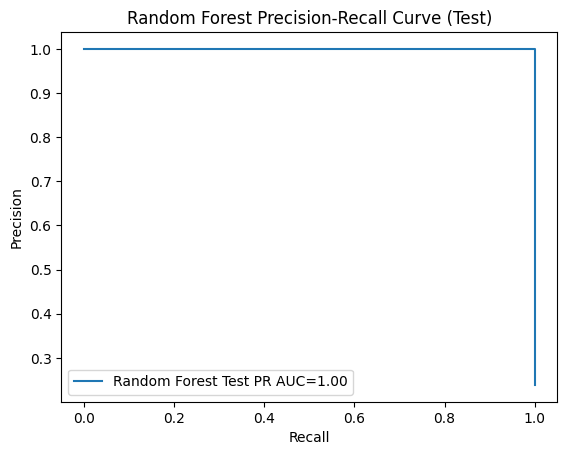

Gradient Boosting Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Gradient Boosting Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Gradient Boosting Test PR AUC: 1.00


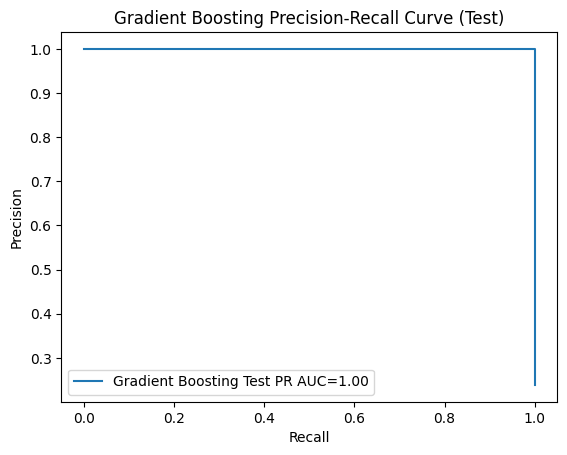

AdaBoost Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

AdaBoost Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

AdaBoost Test PR AUC: 1.00


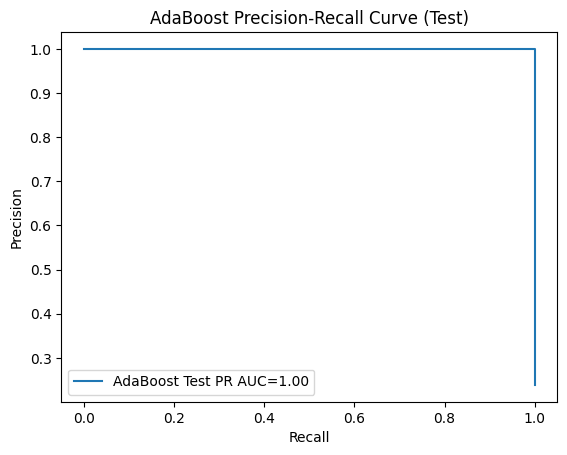

Extra Trees Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Extra Trees Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Extra Trees Test PR AUC: 1.00


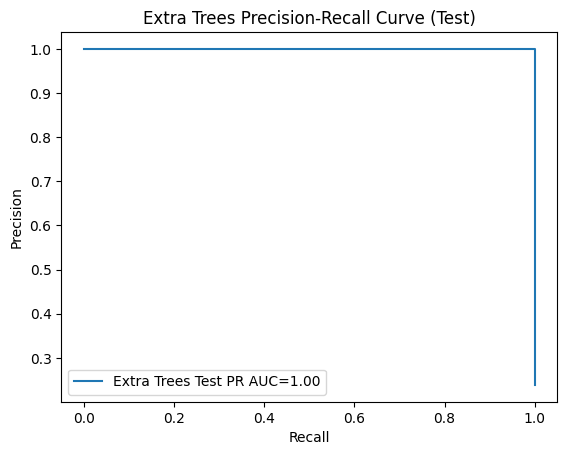

SVM Train Accuracy: 0.7033582089552238
              precision    recall  f1-score   support

           0       0.76      0.59      0.67       268
           1       0.67      0.82      0.73       268

    accuracy                           0.70       536
   macro avg       0.71      0.70      0.70       536
weighted avg       0.71      0.70      0.70       536

SVM Test Accuracy: 0.7159090909090909
              precision    recall  f1-score   support

           0       0.92      0.69      0.79        67
           1       0.45      0.81      0.58        21

    accuracy                           0.72        88
   macro avg       0.68      0.75      0.68        88
weighted avg       0.81      0.72      0.74        88

SVM Test PR AUC: 0.78


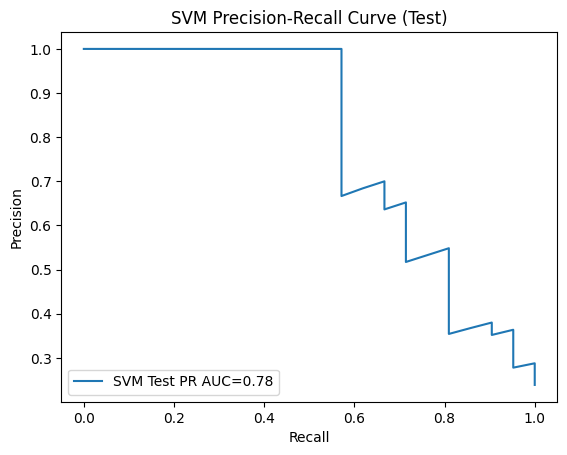

KNN Train Accuracy: 0.9813432835820896
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       268
           1       1.00      0.96      0.98       268

    accuracy                           0.98       536
   macro avg       0.98      0.98      0.98       536
weighted avg       0.98      0.98      0.98       536

KNN Test Accuracy: 0.9431818181818182
              precision    recall  f1-score   support

           0       0.94      0.99      0.96        67
           1       0.94      0.81      0.87        21

    accuracy                           0.94        88
   macro avg       0.94      0.90      0.92        88
weighted avg       0.94      0.94      0.94        88

KNN Test PR AUC: 0.93


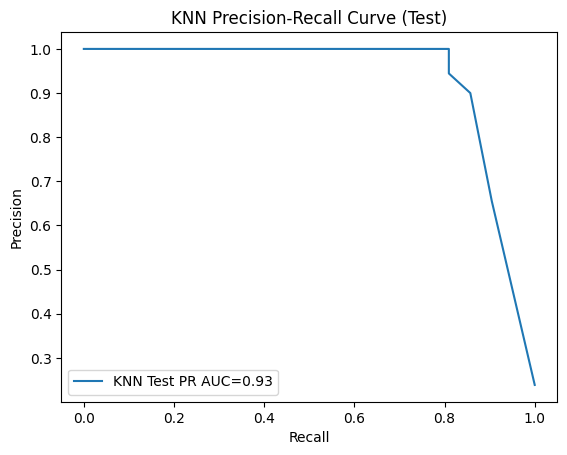

Decision Tree Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Decision Tree Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Decision Tree Test PR AUC: 1.00


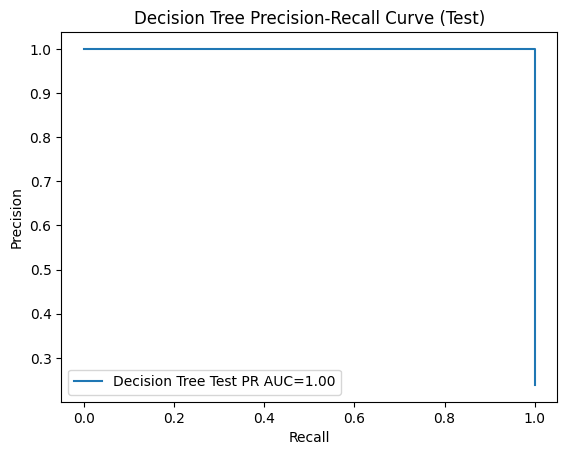

Gaussian Process Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Gaussian Process Test Accuracy: 0.9318181818181818
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        67
           1       1.00      0.71      0.83        21

    accuracy                           0.93        88
   macro avg       0.96      0.86      0.90        88
weighted avg       0.94      0.93      0.93        88

Gaussian Process Test PR AUC: 0.77


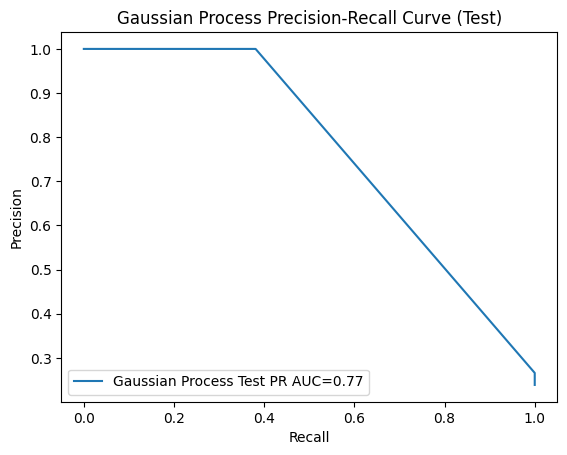

MLP Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

MLP Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

MLP Test PR AUC: 1.00


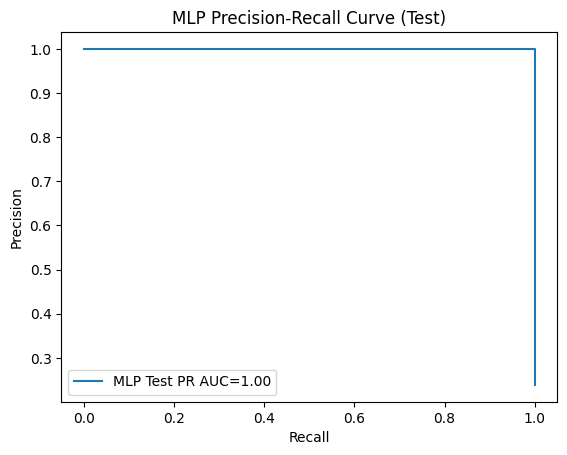

Logistic Regression Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Logistic Regression Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Logistic Regression Test PR AUC: 1.00


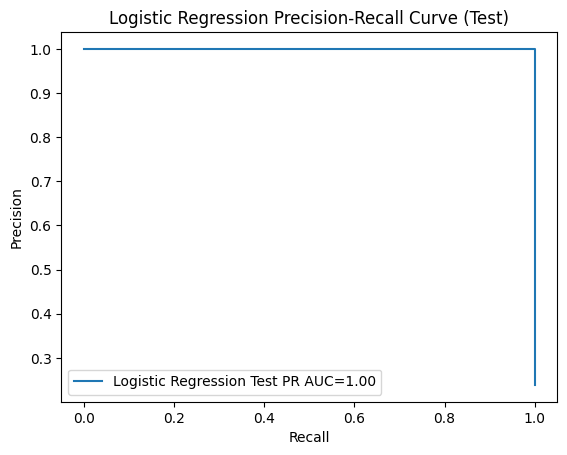


Random Forest predictions:
Labels: [1 0 1 1 0]
Probabilities: [1.   0.   0.95 1.   0.  ]

Gradient Boosting predictions:
Labels: [1 0 1 1 0]
Probabilities: [9.99978098e-01 2.19017313e-05 9.99978098e-01 9.99978098e-01
 2.19017313e-05]

AdaBoost predictions:
Labels: [1 0 1 1 0]
Probabilities: [0.88079708 0.11920292 0.88079708 0.88079708 0.11920292]

Extra Trees predictions:
Labels: [1 0 1 1 0]
Probabilities: [1.   0.   0.94 1.   0.  ]

SVM predictions:
Labels: [1 0 1 1 0]
Probabilities: [0.6847877  0.15955715 0.72014772 0.66326802 0.21907451]

KNN predictions:
Labels: [1 0 0 1 0]
Probabilities: [1.  0.  0.4 1.  0. ]

Decision Tree predictions:
Labels: [1 0 1 1 0]
Probabilities: [1. 0. 1. 1. 0.]

Gaussian Process predictions:
Labels: [1 0 0 0 0]
Probabilities: [0.58470729 0.5        0.5        0.5        0.5       ]

MLP predictions:
Labels: [1 0 1 1 0]
Probabilities: [9.99999994e-01 1.30937027e-11 9.99999997e-01 9.99998927e-01
 1.32948501e-10]

Logistic Regression predictions:
Labels: [

In [15]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, precision_recall_curve, auc
import matplotlib.pyplot as plt

# 1. Load datasets
X_train = pd.read_csv('/content/drive/MyDrive/PS/X_train_resampled.csv')
y_train = pd.read_csv('/content/drive/MyDrive/PS/y_train_resampled.csv')
X_test = pd.read_csv('/content/drive/MyDrive/PS/X_test.csv')
y_test = pd.read_csv('/content/drive/MyDrive/PS/y_test.csv')

y_train = y_train.values.ravel()
y_test = y_test.values.ravel()

# 2. Apply SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# 3. Define ML models
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(probability=True, random_state=42),
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Gaussian Process": GaussianProcessClassifier(),
    "MLP": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=500, random_state=42),
}

# 4. Train & Evaluate models
for model_name, model in models.items():
    model.fit(X_train_resampled, y_train_resampled)

    # Train set evaluation
    y_pred_train = model.predict(X_train_resampled)
    train_acc = accuracy_score(y_train_resampled, y_pred_train)
    print(f"{model_name} Train Accuracy: {train_acc}")
    print(classification_report(y_train_resampled, y_pred_train))

    # Test set evaluation
    y_pred_test = model.predict(X_test)
    test_acc = accuracy_score(y_test, y_pred_test)
    print(f"{model_name} Test Accuracy: {test_acc}")
    print(classification_report(y_test, y_pred_test))

    # Precision-Recall curve
    y_test_prob = model.predict_proba(X_test)[:, 1]
    precision_test, recall_test, _ = precision_recall_curve(y_test, y_test_prob)
    pr_auc_test = auc(recall_test, precision_test)
    print(f"{model_name} Test PR AUC: {pr_auc_test:.2f}")
    plt.plot(recall_test, precision_test, label=f'{model_name} Test PR AUC={pr_auc_test:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'{model_name} Precision-Recall Curve (Test)')
    plt.legend()
    plt.show()

# Predictions on test set
test_predictions = {}
for model_name, model in models.items():
    y_test_pred = model.predict(X_test)
    y_test_proba = model.predict_proba(X_test)[:, 1]

    test_predictions[model_name] = {
        "Predicted_Label": y_test_pred,
        "Predicted_Probability": y_test_proba
    }

    print(f"\n{model_name} predictions:")
    print("Labels:", y_test_pred[:5])
    print("Probabilities:", y_test_proba[:5])


In [16]:
print(f"Training data shape: {X_train.shape}")
print(f"Training labels shape: {y_train.shape}")
print(f"Test data shape: {X_test.shape}")
print(f"Test labels shape: {y_test.shape}")


Training data shape: (536, 31)
Training labels shape: (536,)
Test data shape: (88, 31)
Test labels shape: (88,)


In [17]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
import pandas as pd

# Assuming X_train_resampled and y_train_resampled are defined after applying SMOTE

# Perform 5-fold cross-validation on Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Perform cross-validation
cv_scores = cross_val_score(rf_model, X_train_resampled, y_train_resampled, cv=5, scoring='accuracy')

# Display cross-validation results
print(f"Random Forest Cross-Validation Accuracy: {cv_scores.mean():.2f} ± {cv_scores.std():.2f}")

# Fit the model to the entire training data before accessing feature importances
rf_model.fit(X_train_resampled, y_train_resampled)  # Fit the model to your training data

# Get feature importances
feature_importances = rf_model.feature_importances_
feature_names = X_train_resampled.columns  # Use resampled training features
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df)


Random Forest Cross-Validation Accuracy: 1.00 ± 0.00
                        Feature  Importance
7                   Flexibility    0.190330
8                         Helix    0.172372
2                Hydrophobicity    0.130459
10                        Sheet    0.072668
16                            G    0.072117
19                            K    0.061769
18                            I    0.057305
20                            L    0.056708
15                            F    0.054996
9                          Turn    0.035321
29                            W    0.022817
28                            V    0.016676
1                        Charge    0.012293
25                            R    0.011884
4             Isoelectric_Point    0.009817
11                            A    0.005939
13                            D    0.005210
23                            P    0.002961
14                            E    0.001626
24                            Q    0.001501
6   Number_of_Disulfide

In [18]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
import pandas as pd

# Assuming X_train_resampled and y_train_resampled are defined after applying SMOTE

# Perform 5-fold cross-validation on Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Perform cross-validation
cv_scores = cross_val_score(rf_model, X_train_resampled, y_train_resampled, cv=5, scoring='accuracy')

# Display cross-validation results
print(f"Random Forest Cross-Validation Accuracy: {cv_scores.mean():.2f} ± {cv_scores.std():.2f}")

# Fit the model to the entire training data before accessing feature importances
rf_model.fit(X_train_resampled, y_train_resampled)  # Fit the model to your training data

# Get feature importances
feature_importances = rf_model.feature_importances_
feature_names = X_train_resampled.columns  # Use resampled training features
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df)


Random Forest Cross-Validation Accuracy: 1.00 ± 0.00
                        Feature  Importance
7                   Flexibility    0.190330
8                         Helix    0.172372
2                Hydrophobicity    0.130459
10                        Sheet    0.072668
16                            G    0.072117
19                            K    0.061769
18                            I    0.057305
20                            L    0.056708
15                            F    0.054996
9                          Turn    0.035321
29                            W    0.022817
28                            V    0.016676
1                        Charge    0.012293
25                            R    0.011884
4             Isoelectric_Point    0.009817
11                            A    0.005939
13                            D    0.005210
23                            P    0.002961
14                            E    0.001626
24                            Q    0.001501
6   Number_of_Disulfide

Evaluating Random Forest...
Evaluating Gradient Boosting...
Evaluating AdaBoost...
Evaluating Extra Trees...
Evaluating SVM...
Evaluating KNN...
Evaluating Decision Tree...
Evaluating Gaussian Process...
Evaluating MLP...
Evaluating Logistic Regression...

✅ Cross-Validation Results:
Random Forest:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
Gradient Boosting:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
AdaBoost:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
Extra Trees:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
SVM:
  AUC-PR : 0.8483 ± 0.0182
  F1     : 0.7264 ± 0.0350
  ROC-AUC: 0.8090 ± 0.0166
KNN:
  AUC-PR : 0.9922 ± 0.0069
  F1     : 0.9637 ± 0.0189
  ROC-AUC: 0.9893 ± 0.0086
Decision Tree:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
Gaussian Process:
  AUC-PR : 0.8980 ± 0.0039
  F1     : 0.9570 ± 0

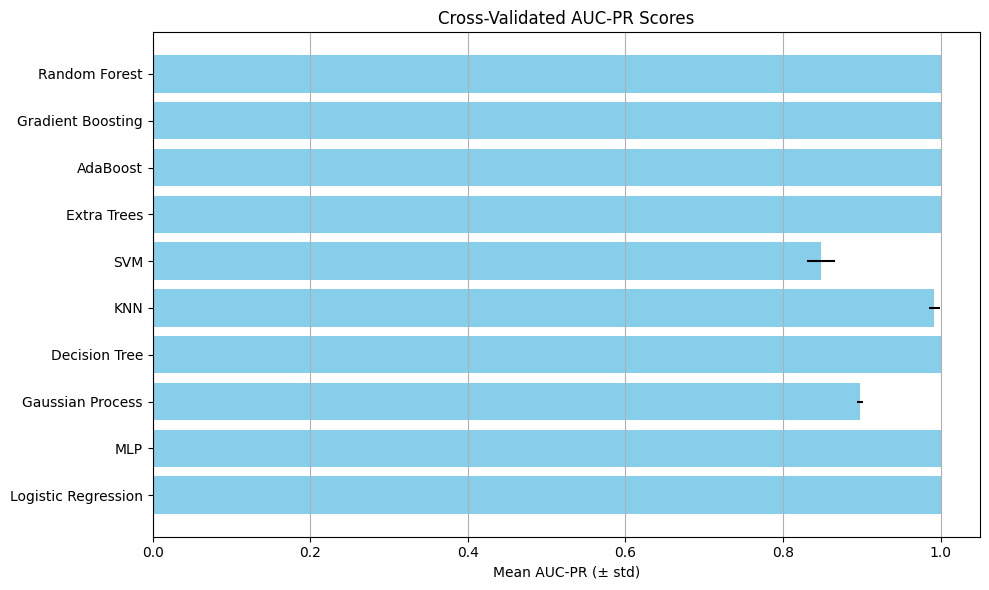

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import precision_recall_curve, auc, f1_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

# Define models
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(probability=True, random_state=42),
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Gaussian Process": GaussianProcessClassifier(),
    "MLP": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=500, random_state=42),
}

# Load dataset
X = pd.read_csv('/content/drive/MyDrive/PS/X_train_resampled.csv')
y = pd.read_csv('/content/drive/MyDrive/PS/y_train_resampled.csv').values.ravel()

# Set up cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize scores
results = {}

for name, model in models.items():
    print(f"Evaluating {name}...")
    auc_pr_list = []
    f1_list = []
    roc_list = []

    for train_idx, val_idx in cv.split(X, y):
        X_train_cv, X_val_cv = X.iloc[train_idx], X.iloc[val_idx]
        y_train_cv, y_val_cv = y[train_idx], y[val_idx]

        # Pipeline: SMOTE + model
        pipeline = Pipeline([
            ("smote", SMOTE(random_state=42)),
            ("clf", model)
        ])

        pipeline.fit(X_train_cv, y_train_cv)
        y_scores = pipeline.predict_proba(X_val_cv)[:, 1]
        y_preds = pipeline.predict(X_val_cv)

        precision, recall, _ = precision_recall_curve(y_val_cv, y_scores)
        auc_pr = auc(recall, precision)
        f1 = f1_score(y_val_cv, y_preds)
        roc = roc_auc_score(y_val_cv, y_scores)

        auc_pr_list.append(auc_pr)
        f1_list.append(f1)
        roc_list.append(roc)

    results[name] = {
        "AUC-PR": (np.mean(auc_pr_list), np.std(auc_pr_list)),
        "F1": (np.mean(f1_list), np.std(f1_list)),
        "ROC-AUC": (np.mean(roc_list), np.std(roc_list))
    }

# Print results
print("\n✅ Cross-Validation Results:")
for name, scores in results.items():
    print(f"{name}:")
    print(f"  AUC-PR : {scores['AUC-PR'][0]:.4f} ± {scores['AUC-PR'][1]:.4f}")
    print(f"  F1     : {scores['F1'][0]:.4f} ± {scores['F1'][1]:.4f}")
    print(f"  ROC-AUC: {scores['ROC-AUC'][0]:.4f} ± {scores['ROC-AUC'][1]:.4f}")

# Plot AUC-PR Comparison
plt.figure(figsize=(10, 6))
model_names = list(results.keys())
auc_values = [results[m]['AUC-PR'][0] for m in model_names]
stds = [results[m]['AUC-PR'][1] for m in model_names]

plt.barh(model_names, auc_values, xerr=stds, color='skyblue')
plt.xlabel('Mean AUC-PR (± std)')
plt.title('Cross-Validated AUC-PR Scores')
plt.gca().invert_yaxis()
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()


In [21]:
print("Test size:", len(y_test))


Test size: 88


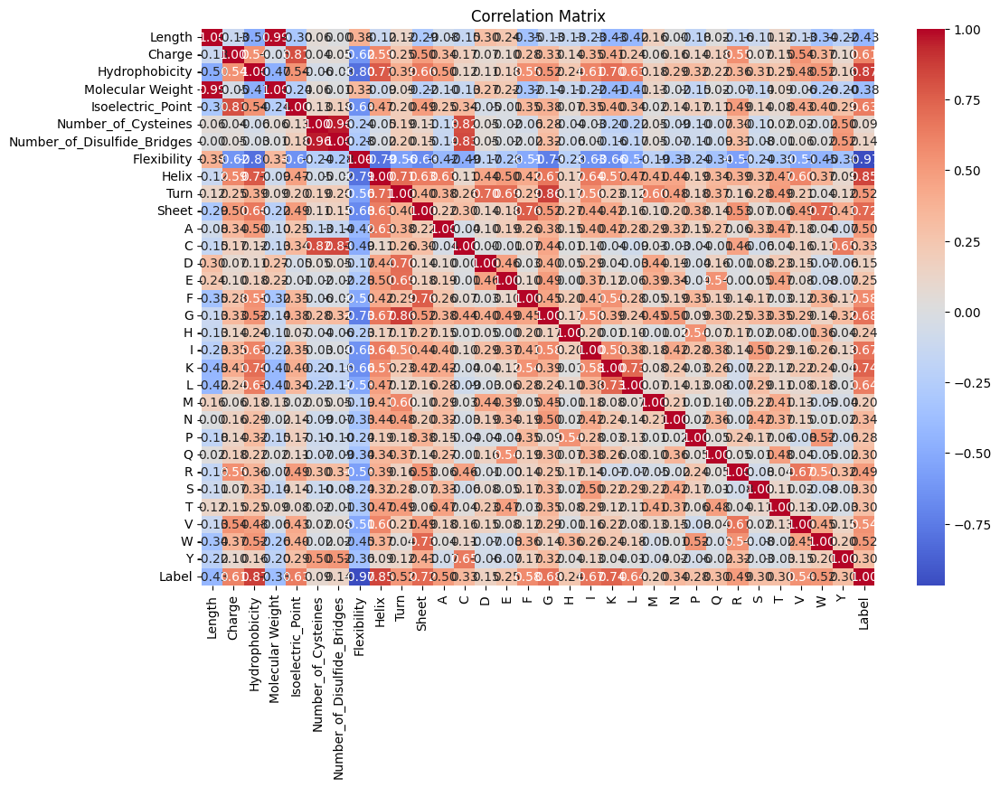

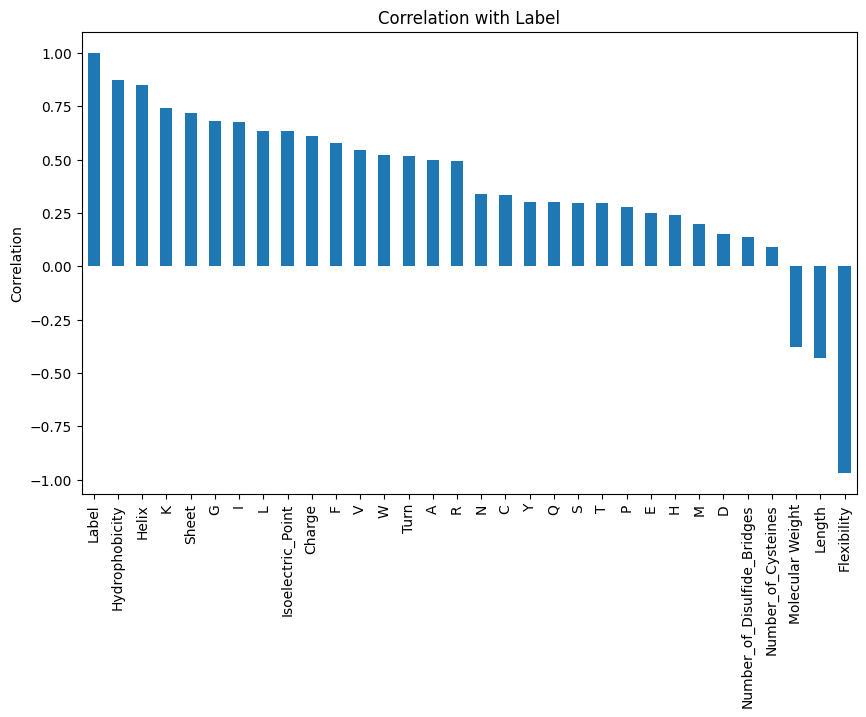

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True)
plt.title("Correlation Matrix")
plt.show()

# Correlation with 'Label'
plt.figure(figsize=(10, 6))
correlation_matrix['Label'].sort_values(ascending=False).plot(kind='bar')
plt.title("Correlation with Label")
plt.ylabel("Correlation")
plt.show()


In [24]:
pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=321380a5465af56556a65b5c4abca3d794e9b5b0cf6ca5c71d39fc4a7ca511f2
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [25]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
from sklearn.ensemble import RandomForestClassifier

# Assuming you already have X_train, y_train, X_test (from previous cells)

# Initialize your model (example: RandomForestClassifier)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)  # Fit the model

# Prepare the explainer
explainer = LimeTabularExplainer(
    training_data=X_train.values,  # Training data (features)
    training_labels=y_train,  # Use y_train directly, as it's already a NumPy array
    mode="classification",  # For classification problems
    feature_names=X_train.columns,  # Column names for features
    discretize_continuous=True,
    class_names=['0', '1']  # Assuming your target classes are 0 and 1
)

# Choose an instance to explain
instance = X_test.iloc[0].values  # Select a test instance to explain
explanation = explainer.explain_instance(instance, model.predict_proba, num_features=10)  # num_features can be adjusted

# Display explanation
explanation.show_in_notebook(show_table=True)  # Show the explanation in a notebook



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [26]:
from sklearn.metrics import classification_report

# Predict labels on test set
y_pred = best_model.predict(X_test)

# Print classification report
print(f"\n🧾 Classification Report for {best_model_name}:")
print(classification_report(y_test, y_pred))


NameError: name 'best_model' is not defined

In [27]:
from sklearn.metrics import classification_report
import joblib # Import joblib to load the model

# Load the best model if it's already saved
best_model = joblib.load('/content/drive/MyDrive/PS/best_model.pkl')

best_model_name = 'Random Forest'  # Or the name of your best model

# Predict labels on test set
y_pred = best_model.predict(X_test)

# Print classification report
print(f"\n🧾 Classification Report for {best_model_name}:")
print(classification_report(y_test, y_pred))


🧾 Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88



extended version of the script that includes Stratified K-Fold Cross-Validation (CV)

In [28]:
import joblib

# Save the best model
joblib.dump(best_model, '/content/drive/MyDrive/PS/best_model.pkl')


['/content/drive/MyDrive/PS/best_model.pkl']

In [29]:
# Save predictions to CSV
predictions_df = pd.DataFrame({'True Labels': y_test, 'Predicted Labels': y_pred})
predictions_df.to_csv('/content/drive/MyDrive/PS/test_predictions.csv', index=False)


In [30]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_test, y_pred)

# Save the classification report as a text file
with open('/content/drive/MyDrive/PS/classification_report.txt', 'w') as f:
    f.write(report)


Evaluating Random Forest...
Evaluating Gradient Boosting...
Evaluating AdaBoost...
Evaluating Extra Trees...
Evaluating SVM...
Evaluating KNN...
Evaluating Decision Tree...
Evaluating Gaussian Process...
Evaluating MLP...
Evaluating Logistic Regression...

✅ Cross-Validation Results:
Random Forest:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
Gradient Boosting:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
AdaBoost:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
Extra Trees:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
SVM:
  AUC-PR : 0.8483 ± 0.0182
  F1     : 0.7264 ± 0.0350
  ROC-AUC: 0.8090 ± 0.0166
KNN:
  AUC-PR : 0.9922 ± 0.0069
  F1     : 0.9637 ± 0.0189
  ROC-AUC: 0.9893 ± 0.0086
Decision Tree:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
Gaussian Process:
  AUC-PR : 0.8980 ± 0.0039
  F1     : 0.9570 ± 0

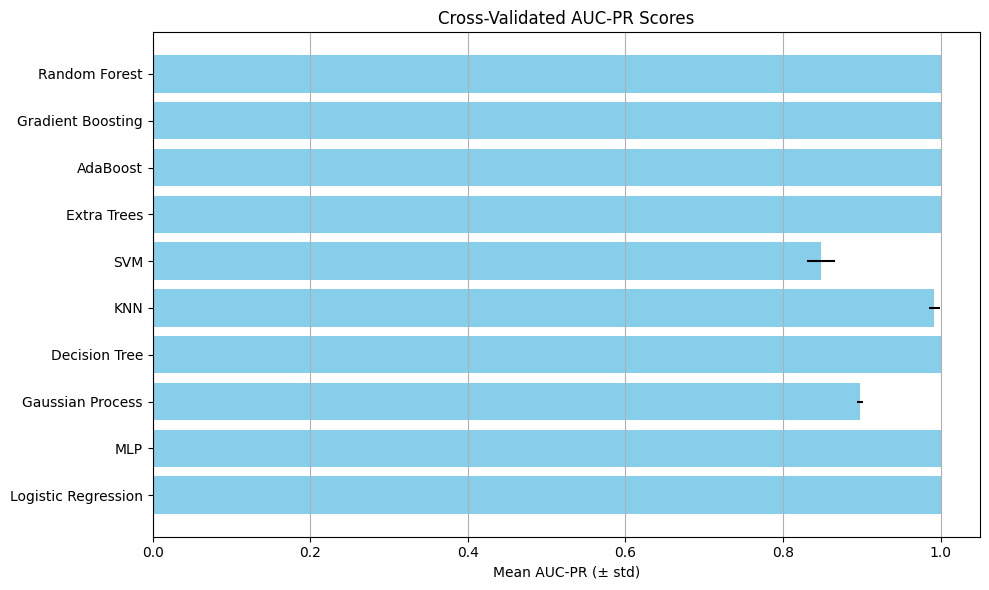

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import precision_recall_curve, auc, f1_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

# Define models
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(probability=True, random_state=42),
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Gaussian Process": GaussianProcessClassifier(),
    "MLP": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42),

}

# Load dataset
X = pd.read_csv('/content/drive/MyDrive/PS/X_train_resampled.csv')
y = pd.read_csv('/content/drive/MyDrive/PS/y_train_resampled.csv').values.ravel()

# Set up cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize results storage
results = {}

# Model evaluation loop
for name, model in models.items():
    print(f"Evaluating {name}...")
    auc_pr_list = []
    f1_list = []
    roc_list = []

    for train_idx, val_idx in cv.split(X, y):
        X_train_cv, X_val_cv = X.iloc[train_idx], X.iloc[val_idx]
        y_train_cv, y_val_cv = y[train_idx], y[val_idx]

        # Pipeline: SMOTE + model
        pipeline = Pipeline([
            ("smote", SMOTE(random_state=42)),
            ("clf", model)
        ])

        pipeline.fit(X_train_cv, y_train_cv)
        y_scores = pipeline.predict_proba(X_val_cv)[:, 1]
        y_preds = pipeline.predict(X_val_cv)

        # Calculate metrics
        precision, recall, _ = precision_recall_curve(y_val_cv, y_scores)
        auc_pr = auc(recall, precision)
        f1 = f1_score(y_val_cv, y_preds)
        roc = roc_auc_score(y_val_cv, y_scores)

        # Append results
        auc_pr_list.append(auc_pr)
        f1_list.append(f1)
        roc_list.append(roc)

    # Store average results for each model
    results[name] = {
        "AUC-PR": (np.mean(auc_pr_list), np.std(auc_pr_list)),
        "F1": (np.mean(f1_list), np.std(f1_list)),
        "ROC-AUC": (np.mean(roc_list), np.std(roc_list))
    }

# Print results summary
print("\n✅ Cross-Validation Results:")
for name, scores in results.items():
    print(f"{name}:")
    print(f"  AUC-PR : {scores['AUC-PR'][0]:.4f} ± {scores['AUC-PR'][1]:.4f}")
    print(f"  F1     : {scores['F1'][0]:.4f} ± {scores['F1'][1]:.4f}")
    print(f"  ROC-AUC: {scores['ROC-AUC'][0]:.4f} ± {scores['ROC-AUC'][1]:.4f}")

# Plot AUC-PR Comparison
plt.figure(figsize=(10, 6))
model_names = list(results.keys())
auc_values = [results[m]['AUC-PR'][0] for m in model_names]
stds = [results[m]['AUC-PR'][1] for m in model_names]

plt.barh(model_names, auc_values, xerr=stds, color='skyblue')
plt.xlabel('Mean AUC-PR (± std)')
plt.title('Cross-Validated AUC-PR Scores')
plt.gca().invert_yaxis()
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()


Evaluating Random Forest...
Evaluating Gradient Boosting...
Evaluating AdaBoost...
Evaluating Extra Trees...
Evaluating SVM...
Evaluating KNN...
Evaluating Decision Tree...
Evaluating Gaussian Process...
Evaluating MLP...

✅ Cross-Validation Results:
Random Forest:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
Gradient Boosting:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
AdaBoost:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
Extra Trees:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
SVM:
  AUC-PR : 0.8483 ± 0.0182
  F1     : 0.7264 ± 0.0350
  ROC-AUC: 0.8090 ± 0.0166
KNN:
  AUC-PR : 0.9922 ± 0.0069
  F1     : 0.9637 ± 0.0189
  ROC-AUC: 0.9893 ± 0.0086
Decision Tree:
  AUC-PR : 1.0000 ± 0.0000
  F1     : 1.0000 ± 0.0000
  ROC-AUC: 1.0000 ± 0.0000
Gaussian Process:
  AUC-PR : 0.8980 ± 0.0039
  F1     : 0.9570 ± 0.0174
  ROC-AUC: 0.8056 ± 0.0078
M

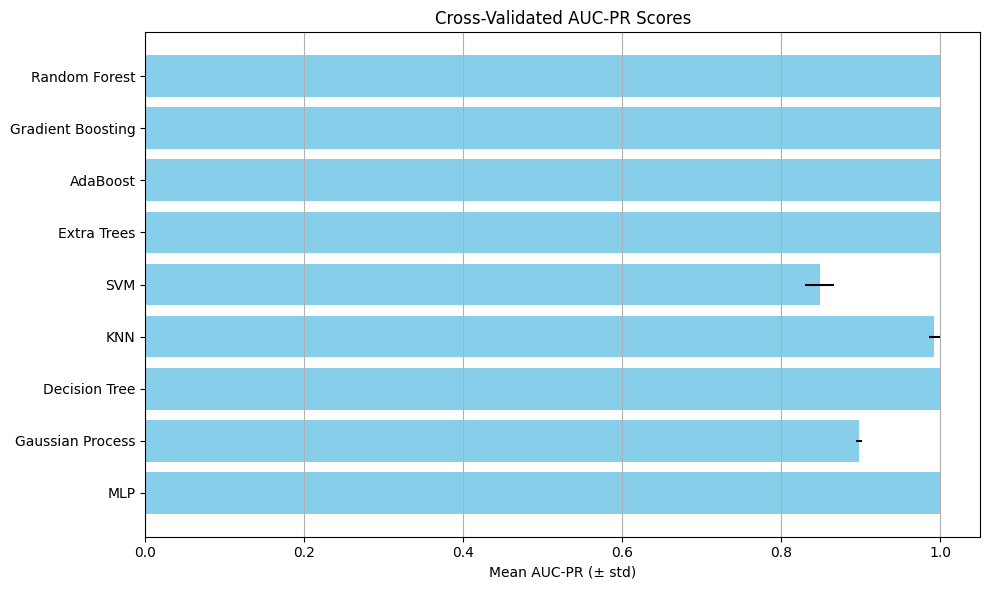

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import precision_recall_curve, auc, f1_score, roc_auc_score
from imblearn.over_sampling import SMOTE # Changed import to imblearn.over_sampling
from imblearn.pipeline import Pipeline

# Define models
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(probability=True, random_state=42),
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Gaussian Process": GaussianProcessClassifier(),
    "MLP": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42),

}

# Load dataset
X = pd.read_csv('/content/drive/MyDrive/PS/X_train_resampled.csv')
y = pd.read_csv('/content/drive/MyDrive/PS/y_train_resampled.csv').values.ravel()

# Set up cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize results storage
results = {}

# Model evaluation loop
for name, model in models.items():
    print(f"Evaluating {name}...")
    auc_pr_list = []
    f1_list = []
    roc_list = []

    for train_idx, val_idx in cv.split(X, y):
        X_train_cv, X_val_cv = X.iloc[train_idx], X.iloc[val_idx]
        y_train_cv, y_val_cv = y[train_idx], y[val_idx]

        # Pipeline: SMOTE + model
        pipeline = Pipeline([
            ("smote", SMOTE(random_state=42)),
            ("clf", model)
        ])

        pipeline.fit(X_train_cv, y_train_cv)
        y_scores = pipeline.predict_proba(X_val_cv)[:, 1]
        y_preds = pipeline.predict(X_val_cv)

        # Calculate metrics
        precision, recall, _ = precision_recall_curve(y_val_cv, y_scores)
        auc_pr = auc(recall, precision)
        f1 = f1_score(y_val_cv, y_preds)
        roc = roc_auc_score(y_val_cv, y_scores)

        # Append results
        auc_pr_list.append(auc_pr)
        f1_list.append(f1)
        roc_list.append(roc)

    # Store average results for each model
    results[name] = {
        "AUC-PR": (np.mean(auc_pr_list), np.std(auc_pr_list)),
        "F1": (np.mean(f1_list), np.std(f1_list)),
        "ROC-AUC": (np.mean(roc_list), np.std(roc_list))
    }

# Save results to CSV
results_df = pd.DataFrame.from_dict(results, orient='index')
results_df.to_csv('/content/drive/MyDrive/PS/model_evaluation_results.csv')

# Print results summary
print("\n✅ Cross-Validation Results:")
for name, scores in results.items():
    print(f"{name}:")
    print(f"  AUC-PR : {scores['AUC-PR'][0]:.4f} ± {scores['AUC-PR'][1]:.4f}")
    print(f"  F1     : {scores['F1'][0]:.4f} ± {scores['F1'][1]:.4f}")
    print(f"  ROC-AUC: {scores['ROC-AUC'][0]:.4f} ± {scores['ROC-AUC'][1]:.4f}")

# Plot AUC-PR Comparison
plt.figure(figsize=(10, 6))
model_names = list(results.keys())
auc_values = [results[m]['AUC-PR'][0] for m in model_names]
stds = [results[m]['AUC-PR'][1] for m in model_names]

# Create a horizontal bar plot
plt.barh(model_names, auc_values, xerr=stds, color='skyblue')
plt.xlabel('Mean AUC-PR (± std)')
plt.title('Cross-Validated AUC-PR Scores')
plt.gca().invert_yaxis()
plt.grid(True, axis='x')
plt.tight_layout()

# Save the plot to Google Drive
plt.savefig('/content/drive/MyDrive/PS/auc_pr_comparison.png')

# Optionally, display the plot
plt.show()

Evaluating Random Forest...
Evaluating Gradient Boosting...
Evaluating AdaBoost...
Evaluating Extra Trees...
Evaluating SVM...
Evaluating KNN...
Evaluating Decision Tree...
Evaluating Gaussian Process...
Evaluating MLP...

Best Model: Random Forest with AUC-PR: 1.0000


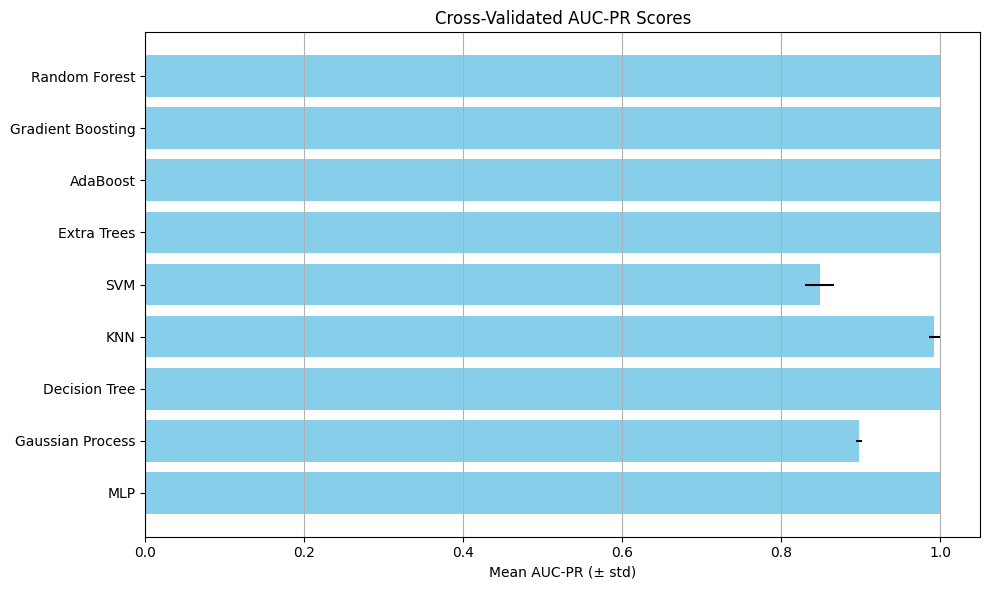


Best Model: Random Forest
AUC-PR Score: 1.0000
Plot saved to /content/drive/MyDrive/PS/auc_pr_comparison.png


In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import precision_recall_curve, auc, f1_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

# Define models
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(probability=True, random_state=42),
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Gaussian Process": GaussianProcessClassifier(),
    "MLP": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42),

}

# Load dataset
X = pd.read_csv('/content/drive/MyDrive/PS/X_train_resampled.csv')
y = pd.read_csv('/content/drive/MyDrive/PS/y_train_resampled.csv').values.ravel()

# Set up cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize results storage
results = {}

# Model evaluation loop
for name, model in models.items():
    print(f"Evaluating {name}...")
    auc_pr_list = []
    f1_list = []
    roc_list = []

    for train_idx, val_idx in cv.split(X, y):
        X_train_cv, X_val_cv = X.iloc[train_idx], X.iloc[val_idx]
        y_train_cv, y_val_cv = y[train_idx], y[val_idx]

        # Pipeline: SMOTE + model
        pipeline = Pipeline([
            ("smote", SMOTE(random_state=42)),
            ("clf", model)
        ])

        pipeline.fit(X_train_cv, y_train_cv)
        y_scores = pipeline.predict_proba(X_val_cv)[:, 1]
        y_preds = pipeline.predict(X_val_cv)

        # Calculate metrics
        precision, recall, _ = precision_recall_curve(y_val_cv, y_scores)
        auc_pr = auc(recall, precision)
        f1 = f1_score(y_val_cv, y_preds)
        roc = roc_auc_score(y_val_cv, y_scores)

        # Append results
        auc_pr_list.append(auc_pr)
        f1_list.append(f1)
        roc_list.append(roc)

    # Store average results for each model
    results[name] = {
        "AUC-PR": (np.mean(auc_pr_list), np.std(auc_pr_list)),
        "F1": (np.mean(f1_list), np.std(f1_list)),
        "ROC-AUC": (np.mean(roc_list), np.std(roc_list))
    }

# Find the best model based on AUC-PR
best_model_name = max(results, key=lambda x: results[x]['AUC-PR'][0])
best_model_score = results[best_model_name]['AUC-PR'][0]

# Print the best model and its AUC-PR score
print(f"\nBest Model: {best_model_name} with AUC-PR: {best_model_score:.4f}")

# Save the results to CSV
results_df = pd.DataFrame.from_dict(results, orient='index')
results_df.to_csv('/content/drive/MyDrive/PS/model_evaluation_results.csv')

# Plot AUC-PR Comparison
plt.figure(figsize=(10, 6))
model_names = list(results.keys())
auc_values = [results[m]['AUC-PR'][0] for m in model_names]
stds = [results[m]['AUC-PR'][1] for m in model_names]

# Create a horizontal bar plot
plt.barh(model_names, auc_values, xerr=stds, color='skyblue')
plt.xlabel('Mean AUC-PR (± std)')
plt.title('Cross-Validated AUC-PR Scores')
plt.gca().invert_yaxis()
plt.grid(True, axis='x')
plt.tight_layout()

# Save the plot to Google Drive
plot_path = '/content/drive/MyDrive/PS/auc_pr_comparison.png'
plt.savefig(plot_path)

# Optionally, display the plot
plt.show()

# Display the best model and AUC-PR
print(f"\nBest Model: {best_model_name}")
print(f"AUC-PR Score: {best_model_score:.4f}")
print(f"Plot saved to {plot_path}")


In [36]:
import joblib

# Save the Random Forest model to Google Drive
joblib.dump(best_model, '/content/drive/MyDrive/PS/random_forest_model.pkl')

print("Best Random Forest model saved to /content/drive/MyDrive/PS/random_forest_model.pkl")


Best Random Forest model saved to /content/drive/MyDrive/PS/random_forest_model.pkl


In [37]:
# Predict labels on the test set
y_pred_test = best_model.predict(X_test)

# Predict probabilities on the test set
y_pred_prob = best_model.predict_proba(X_test)[:, 1]

# Save predictions to a CSV file
predictions_df = pd.DataFrame({'True Labels': y_test, 'Predicted Labels': y_pred_test, 'Predicted Probability': y_pred_prob})
predictions_df.to_csv('/content/drive/MyDrive/PS/random_forest_predictions.csv', index=False)

print("Predictions saved to /content/drive/MyDrive/PS/random_forest_predictions.csv")


Predictions saved to /content/drive/MyDrive/PS/random_forest_predictions.csv


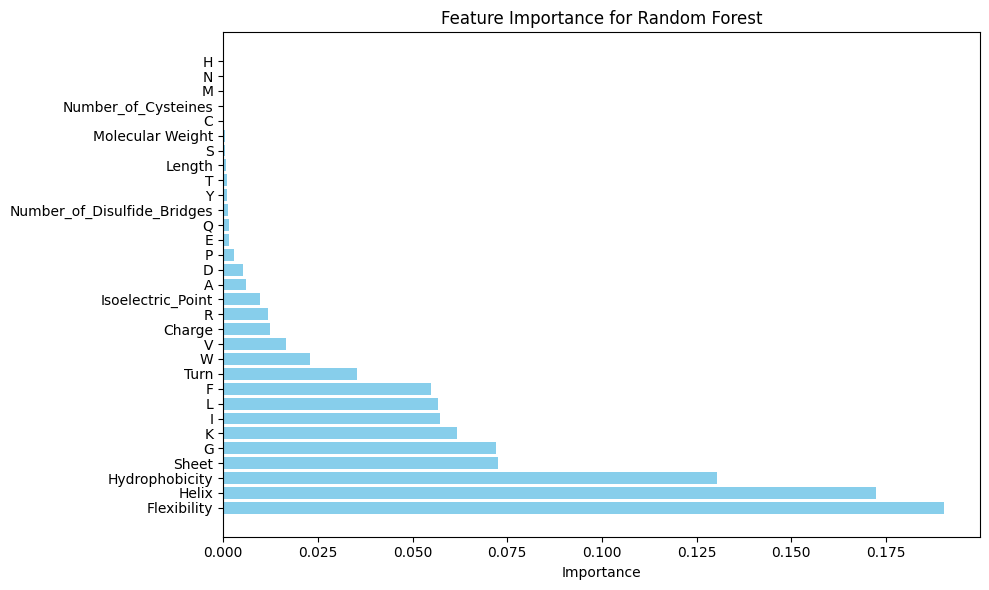

Feature importance plot saved to /content/drive/MyDrive/PS/feature_importance_random_forest.png


In [39]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y)  # Or use appropriate training data
feature_importances = rf_model.feature_importances_
features = X.columns

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.title("Feature Importance for Random Forest")
plt.xlabel("Importance")
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/PS/feature_importance_random_forest.png')
plt.show()

print("Feature importance plot saved to /content/drive/MyDrive/PS/feature_importance_random_forest.png")


In [40]:
from lime.lime_tabular import LimeTabularExplainer

# Create an explainer object
explainer = LimeTabularExplainer(
    training_data=X.values,  # Feature data
    training_labels=y,       # Labels
    mode="classification",   # Classification problem
    feature_names=X.columns, # Feature names
    class_names=["0", "1"],  # Class names (assuming binary classification)
    discretize_continuous=True
)

# Choose an instance to explain (e.g., the first instance in X_test)
instance = X.iloc[0].values

# Get the explanation for the model's prediction
explanation = explainer.explain_instance(instance, rf_model.predict_proba, num_features=10)

# Show the explanation (which will also indicate if the feature has a positive or negative effect on the prediction)
explanation.show_in_notebook(show_table=True)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [41]:
from lime.lime_tabular import LimeTabularExplainer

# Initialize explainer
explainer = LimeTabularExplainer(
    training_data=X.values,
    training_labels=y,
    mode='classification',
    feature_names=X.columns,
    class_names=['0', '1'],
    discretize_continuous=True
)

# Explain a prediction
instance = X.iloc[0].values  # or choose any instance
explanation = explainer.explain_instance(instance, model.predict_proba, num_features=10)

# Show explanation
explanation.show_in_notebook(show_table=True)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


In [42]:
# For Random Forest or Gradient Boosting
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X, y)

# Get feature importances
feature_importances = model.feature_importances_

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Show the top features (positive influence)
print("Top features contributing positively to class 1 prediction:")
print(importance_df.head())

# If you want to inspect feature thresholds or splits, you can use tree-specific functions or visualizations.


Top features contributing positively to class 1 prediction:
           Feature  Importance
7      Flexibility    0.190330
8            Helix    0.172372
2   Hydrophobicity    0.130459
10           Sheet    0.072668
16               G    0.072117


In [44]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# Assuming you have already trained your model (e.g., RandomForestClassifier)
# and that your X_test is available

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=X.values,  # Feature data
    training_labels=y,       # Labels (y_train)
    mode="classification",   # Classification task
    feature_names=X.columns, # Feature names (X_train columns)
    class_names=['0', '1'],  # Class names (0 and 1 for binary classification)
    discretize_continuous=True
)

# Choose an instance from the test set to explain
instance = X.iloc[0].values  # You can choose any instance, here we take the first one

# Explain the instance prediction for class 1 (target=1)
explanation = explainer.explain_instance(instance, rf_model.predict_proba, num_features=10)

# Show the explanation in the notebook (can see feature contributions)
explanation.show_in_notebook(show_table=True)

# Alternatively, print the explanation for feature contributions (positive/negative)
print("\nExplanation for the prediction of class 1:")
for feature, contribution in explanation.as_list():
    print(f"{feature}: {contribution:.4f}")


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(



Explanation for the prediction of class 1:
Flexibility > 1.01: -0.1640
Helix <= 0.31: -0.1513
-14.57 < Hydrophobicity <= 17.72: -0.0696
0.05 < K <= 0.16: -0.0531
G <= 0.03: -0.0390
Sheet <= 0.29: -0.0387
L <= 0.06: -0.0340
0.00 < F <= 0.07: -0.0339
W <= 0.00: -0.0334
I <= 0.00: -0.0257


Random Forest model saved to /content/drive/MyDrive/PS/random_forest_model.pkl


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


LIME explanation saved to /content/drive/MyDrive/PS/lime_explanation_class_1.csv


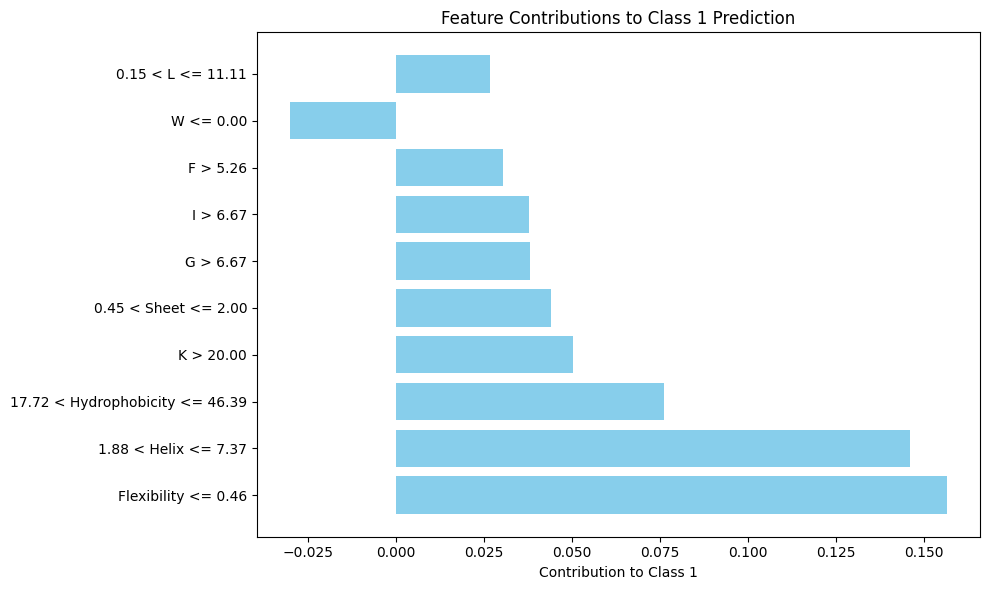

Feature contribution plot saved to /content/drive/MyDrive/PS/lime_feature_contributions_class_1.png

Classification Report for Random Forest on Test Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Predictions saved to /content/drive/MyDrive/PS/random_forest_predictions.csv


In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from lime.lime_tabular import LimeTabularExplainer
import joblib

# 1. Load the dataset (assuming you have /content/drive/MyDrive/PS/X_train_resampled.csv,/content/drive/MyDrive/PS/X_test.csv, /content/drive/MyDrive/PS/y_train_resampled.csv, /content/drive/MyDrive/PS/y_test.csv
# already loaded)


# 2. Train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# 3. Save the trained model to Google Drive
joblib.dump(rf_model, '/content/drive/MyDrive/PS/random_forest_model.pkl')
print("Random Forest model saved to /content/drive/MyDrive/PS/random_forest_model.pkl")

# 4. Explain a prediction using LIME (For instance, using the first test instance)
explainer = LimeTabularExplainer(
    training_data=X_train.values,  # Training data (features)
    training_labels=y_train,       # Labels (y_train)
    mode="classification",         # Classification task
    feature_names=X_train.columns, # Feature names (X_train columns)
    class_names=['0', '1'],        # Class names (0 and 1 for binary classification)
    discretize_continuous=True     # Discretize continuous features
)

# Select the first instance in X_test to explain
instance = X_test.iloc[0].values

# Get the explanation for class 1 prediction
explanation = explainer.explain_instance(instance, rf_model.predict_proba, num_features=10)

# 5. Show the explanation in the notebook
explanation.show_in_notebook(show_table=True)

# 6. Save the LIME explanation to a CSV file (optional)
explanation_list = explanation.as_list()
explanation_df = pd.DataFrame(explanation_list, columns=['Feature', 'Contribution'])
explanation_df.to_csv('/content/drive/MyDrive/PS/lime_explanation_class_1.csv', index=False)
print("LIME explanation saved to /content/drive/MyDrive/PS/lime_explanation_class_1.csv")

# 7. Plot the feature contributions for class 1
plt.figure(figsize=(10, 6))
plt.barh(explanation_df['Feature'], explanation_df['Contribution'], color='skyblue')
plt.title(f"Feature Contributions to Class 1 Prediction")
plt.xlabel('Contribution to Class 1')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/PS/lime_feature_contributions_class_1.png')
plt.show()
print("Feature contribution plot saved to /content/drive/MyDrive/PS/lime_feature_contributions_class_1.png")

# 8. Evaluate the model performance on the test set (optional)
y_pred = rf_model.predict(X_test)
print("\nClassification Report for Random Forest on Test Set:")
print(classification_report(y_test, y_pred))

# 9. Save the predictions to CSV (optional)
predictions_df = pd.DataFrame({'True Labels': y_test, 'Predicted Labels': y_pred})
predictions_df.to_csv('/content/drive/MyDrive/PS/random_forest_predictions.csv', index=False)
print("Predictions saved to /content/drive/MyDrive/PS/random_forest_predictions.csv")


Random Forest Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Random Forest Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Random Forest Test PR AUC: 1.00


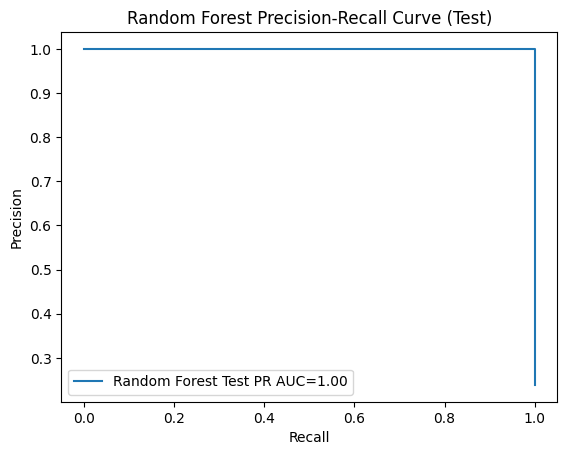

Gradient Boosting Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Gradient Boosting Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Gradient Boosting Test PR AUC: 1.00


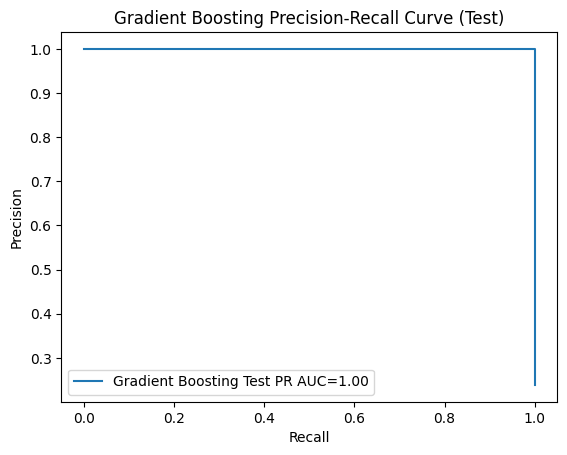

AdaBoost Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

AdaBoost Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

AdaBoost Test PR AUC: 1.00


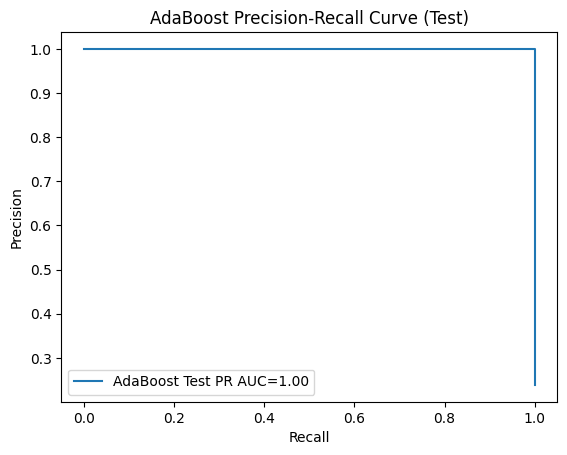

Extra Trees Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Extra Trees Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Extra Trees Test PR AUC: 1.00


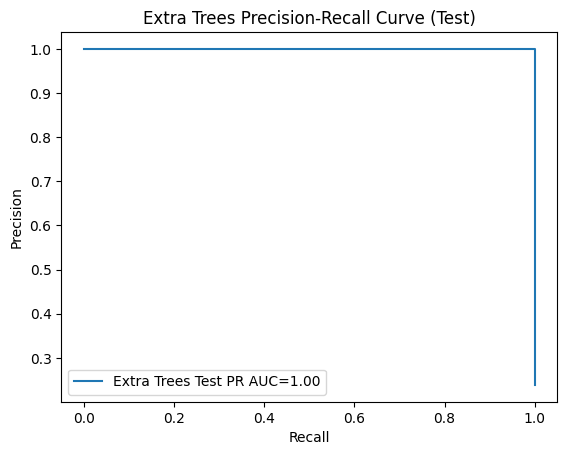

SVM Train Accuracy: 0.7033582089552238
              precision    recall  f1-score   support

           0       0.76      0.59      0.67       268
           1       0.67      0.82      0.73       268

    accuracy                           0.70       536
   macro avg       0.71      0.70      0.70       536
weighted avg       0.71      0.70      0.70       536

SVM Test Accuracy: 0.7159090909090909
              precision    recall  f1-score   support

           0       0.92      0.69      0.79        67
           1       0.45      0.81      0.58        21

    accuracy                           0.72        88
   macro avg       0.68      0.75      0.68        88
weighted avg       0.81      0.72      0.74        88

SVM Test PR AUC: 0.78


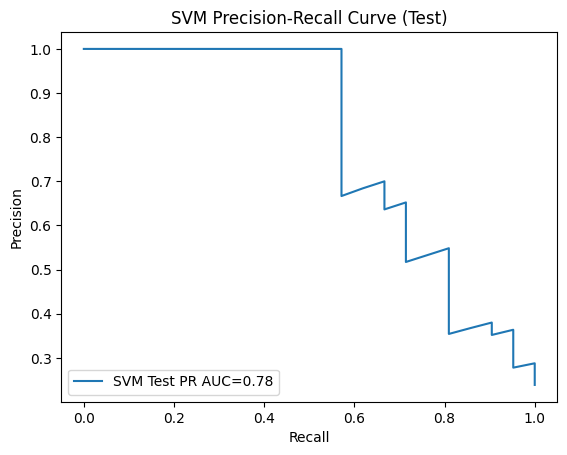

KNN Train Accuracy: 0.9813432835820896
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       268
           1       1.00      0.96      0.98       268

    accuracy                           0.98       536
   macro avg       0.98      0.98      0.98       536
weighted avg       0.98      0.98      0.98       536

KNN Test Accuracy: 0.9431818181818182
              precision    recall  f1-score   support

           0       0.94      0.99      0.96        67
           1       0.94      0.81      0.87        21

    accuracy                           0.94        88
   macro avg       0.94      0.90      0.92        88
weighted avg       0.94      0.94      0.94        88

KNN Test PR AUC: 0.93


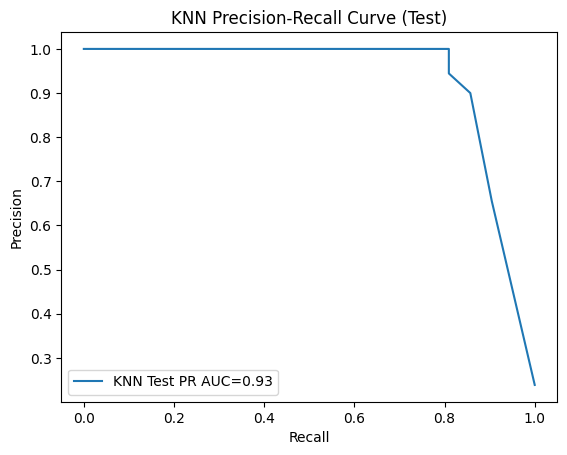

Decision Tree Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Decision Tree Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Decision Tree Test PR AUC: 1.00


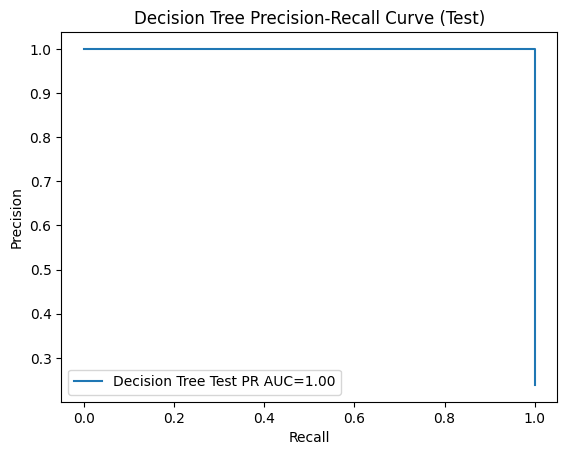

Gaussian Process Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Gaussian Process Test Accuracy: 0.9318181818181818
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        67
           1       1.00      0.71      0.83        21

    accuracy                           0.93        88
   macro avg       0.96      0.86      0.90        88
weighted avg       0.94      0.93      0.93        88

Gaussian Process Test PR AUC: 0.77


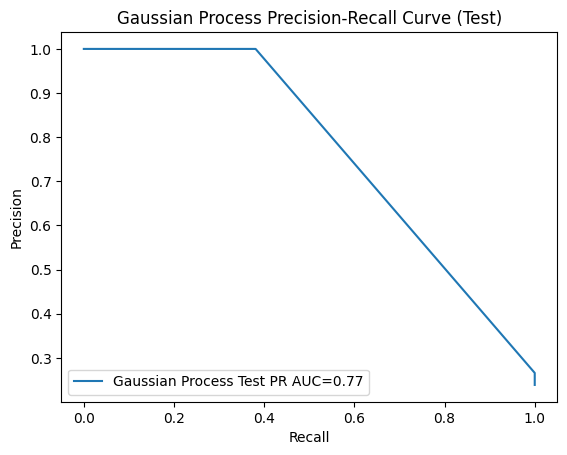

MLP Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

MLP Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

MLP Test PR AUC: 1.00


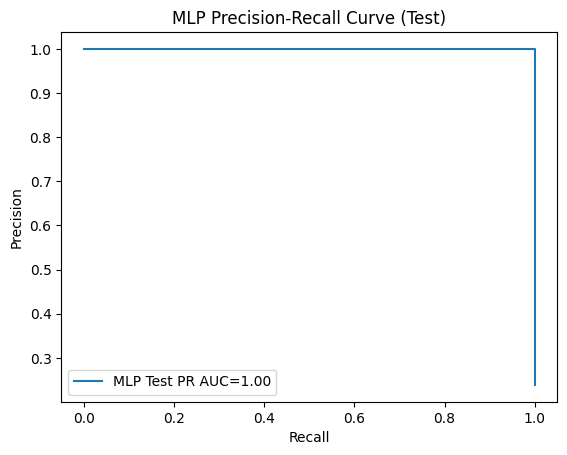

Logistic Regression Train Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       268
           1       1.00      1.00      1.00       268

    accuracy                           1.00       536
   macro avg       1.00      1.00      1.00       536
weighted avg       1.00      1.00      1.00       536

Logistic Regression Test Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        67
           1       1.00      1.00      1.00        21

    accuracy                           1.00        88
   macro avg       1.00      1.00      1.00        88
weighted avg       1.00      1.00      1.00        88

Logistic Regression Test PR AUC: 1.00


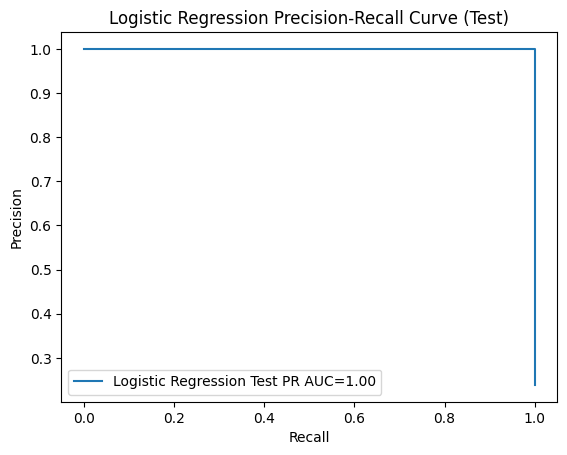


Random Forest predictions:
Labels: [1 0 1 1 0]
Probabilities: [1.   0.   0.95 1.   0.  ]

Gradient Boosting predictions:
Labels: [1 0 1 1 0]
Probabilities: [9.99978098e-01 2.19017313e-05 9.99978098e-01 9.99978098e-01
 2.19017313e-05]

AdaBoost predictions:
Labels: [1 0 1 1 0]
Probabilities: [0.88079708 0.11920292 0.88079708 0.88079708 0.11920292]

Extra Trees predictions:
Labels: [1 0 1 1 0]
Probabilities: [1.   0.   0.94 1.   0.  ]

SVM predictions:
Labels: [1 0 1 1 0]
Probabilities: [0.6847877  0.15955715 0.72014772 0.66326802 0.21907451]

KNN predictions:
Labels: [1 0 0 1 0]
Probabilities: [1.  0.  0.4 1.  0. ]

Decision Tree predictions:
Labels: [1 0 1 1 0]
Probabilities: [1. 0. 1. 1. 0.]

Gaussian Process predictions:
Labels: [1 0 0 0 0]
Probabilities: [0.58470729 0.5        0.5        0.5        0.5       ]

MLP predictions:
Labels: [1 0 1 1 0]
Probabilities: [9.99999994e-01 1.30937027e-11 9.99999997e-01 9.99998927e-01
 1.32948501e-10]

Logistic Regression predictions:
Labels: [

In [47]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, precision_recall_curve, auc
import matplotlib.pyplot as plt

# 1. Load datasets
X_train = pd.read_csv('/content/drive/MyDrive/PS/X_train_resampled.csv')  # Training features
y_train = pd.read_csv('/content/drive/MyDrive/PS/y_train_resampled.csv')  # Training labels
X_test = pd.read_csv('/content/drive/MyDrive/PS/X_test.csv')  # Test features
y_test = pd.read_csv('/content/drive/MyDrive/PS/y_test.csv')  # Test labels

# Flatten the labels from DataFrames to arrays
y_train = y_train.values.ravel()
y_test = y_test.values.ravel()



# 3. Define multiple machine learning models for evaluation
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(probability=True, random_state=42),
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Gaussian Process": GaussianProcessClassifier(),
    "MLP": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=500, random_state=42),
}

# 4. Train & Evaluate models
for model_name, model in models.items():
    model.fit(X_train_resampled, y_train_resampled)  # Train model on resampled data

    # Train set evaluation
    y_pred_train = model.predict(X_train_resampled)
    train_acc = accuracy_score(y_train_resampled, y_pred_train)  # Accuracy on training data
    print(f"{model_name} Train Accuracy: {train_acc}")
    print(classification_report(y_train_resampled, y_pred_train))

    # Test set evaluation
    y_pred_test = model.predict(X_test)
    test_acc = accuracy_score(y_test, y_pred_test)  # Accuracy on test data
    print(f"{model_name} Test Accuracy: {test_acc}")
    print(classification_report(y_test, y_pred_test))

    # Precision-Recall curve
    y_test_prob = model.predict_proba(X_test)[:, 1]  # Get the predicted probabilities for the positive class
    precision_test, recall_test, _ = precision_recall_curve(y_test, y_test_prob)
    pr_auc_test = auc(recall_test, precision_test)  # Compute the Area Under Curve (AUC) for Precision-Recall curve
    print(f"{model_name} Test PR AUC: {pr_auc_test:.2f}")

    # Plot the Precision-Recall curve
    plt.plot(recall_test, precision_test, label=f'{model_name} Test PR AUC={pr_auc_test:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'{model_name} Precision-Recall Curve (Test)')
    plt.legend()
    plt.show()

# 5. Predictions on test set
test_predictions = {}  # Dictionary to store predictions for each model

for model_name, model in models.items():
    y_test_pred = model.predict(X_test)  # Predicted class labels
    y_test_proba = model.predict_proba(X_test)[:, 1]  # Predicted probabilities for the positive class

    test_predictions[model_name] = {
        "Predicted_Label": y_test_pred,
        "Predicted_Probability": y_test_proba
    }

    print(f"\n{model_name} predictions:")
    print("Labels:", y_test_pred[:5])  # Print the first 5 predicted labels
    print("Probabilities:", y_test_proba[:5])  # Print the first 5 predicted probabilities


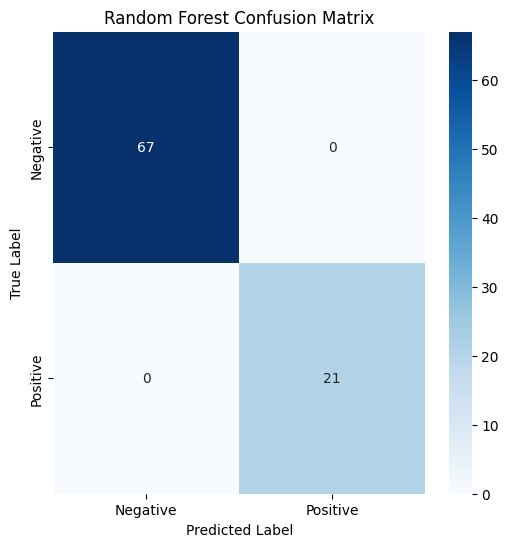

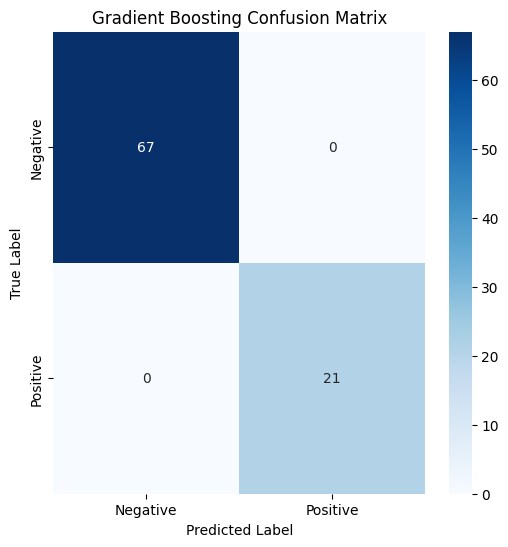

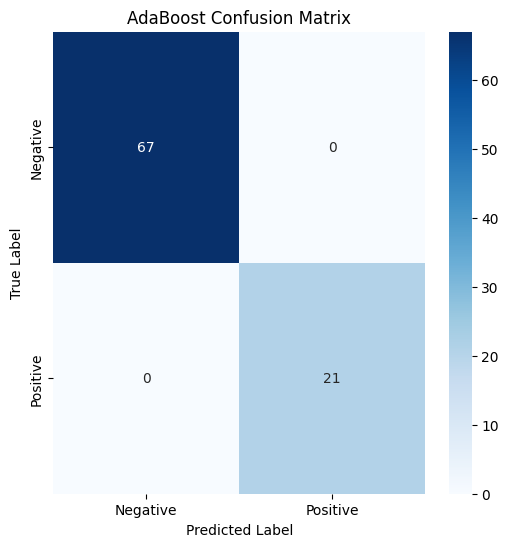

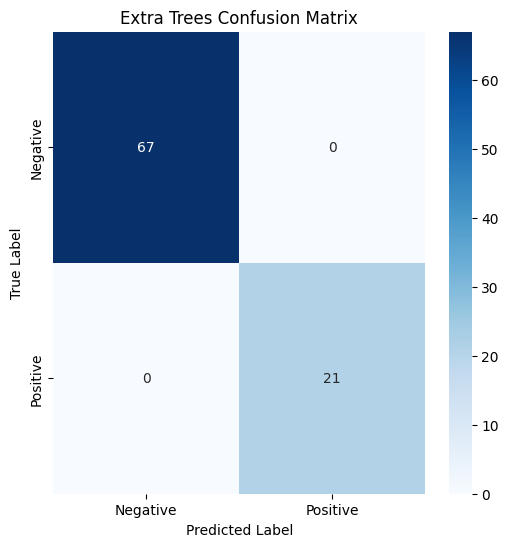

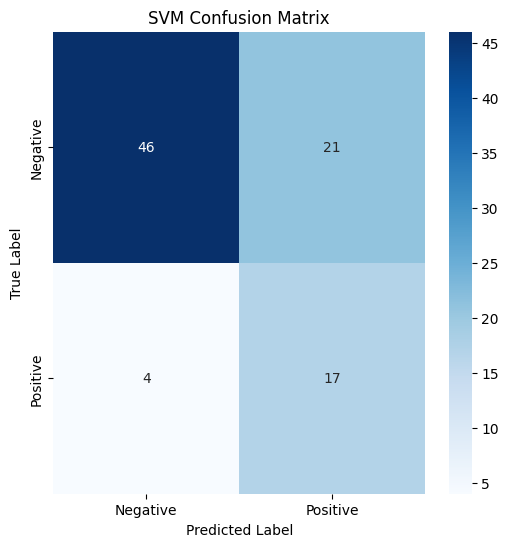

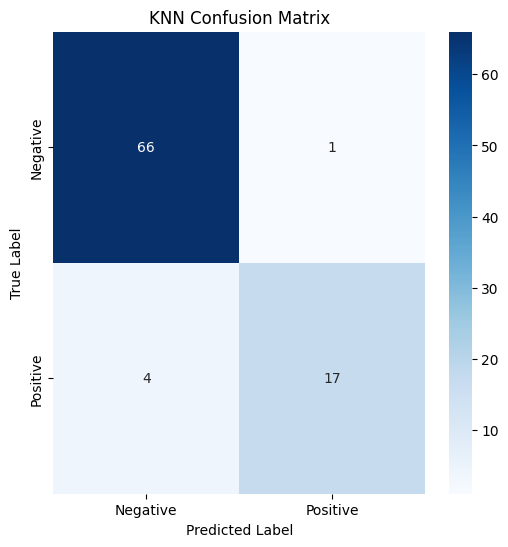

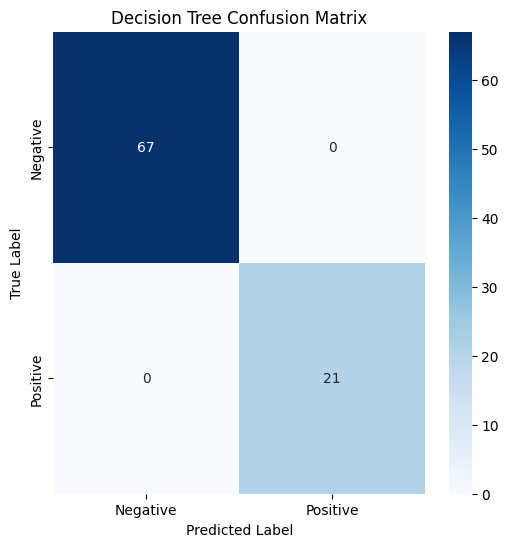

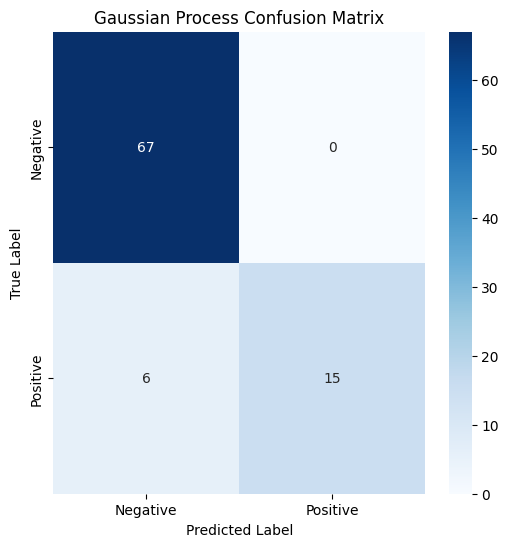

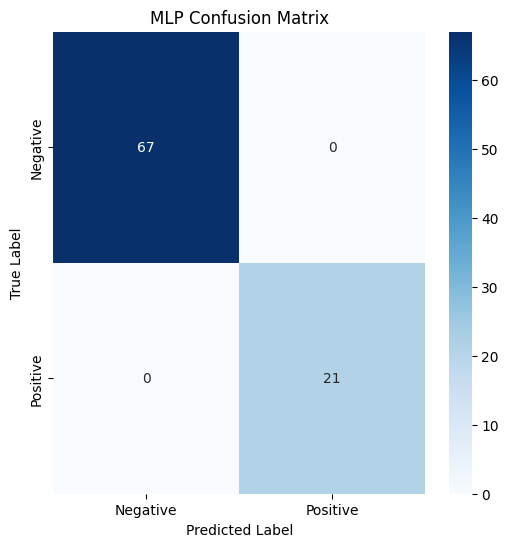

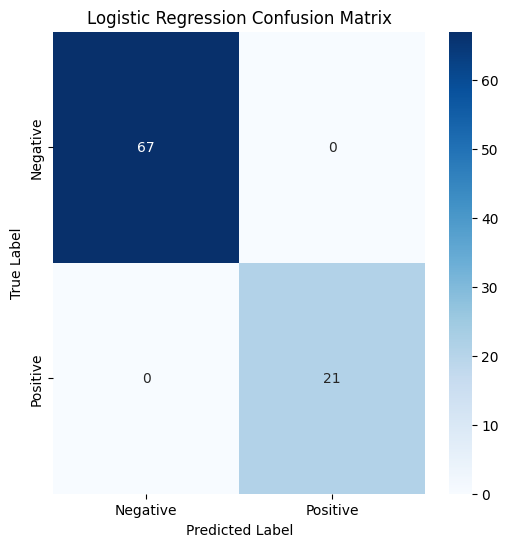

In [48]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

for model_name, model in models.items():
    # Test set evaluation
    y_pred_test = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred_test)

    # Plot confusion matrix
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Negative", "Positive"], yticklabels=["Negative", "Positive"])
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()


In [49]:
from sklearn.model_selection import cross_val_score

for model_name, model in models.items():
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')
    print(f"{model_name} Cross-Validation Accuracy: {cv_scores.mean()} ± {cv_scores.std()}")


Random Forest Cross-Validation Accuracy: 1.0 ± 0.0
Gradient Boosting Cross-Validation Accuracy: 1.0 ± 0.0
AdaBoost Cross-Validation Accuracy: 1.0 ± 0.0
Extra Trees Cross-Validation Accuracy: 1.0 ± 0.0
SVM Cross-Validation Accuracy: 0.699705780546902 ± 0.02630305945091708
KNN Cross-Validation Accuracy: 0.9664243682935272 ± 0.019231214147587345
Decision Tree Cross-Validation Accuracy: 1.0 ± 0.0
Gaussian Process Cross-Validation Accuracy: 0.9608168916580132 ± 0.010911720021534909
MLP Cross-Validation Accuracy: 1.0 ± 0.0
Logistic Regression Cross-Validation Accuracy: 1.0 ± 0.0


In [50]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train, y_train)

print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validation Score: {grid_search.best_score_}")


Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Cross-Validation Score: 1.0
